<center> 
    <h1>Potato Leaf Disease Classification</h1> 
</center>

<img src="images\potato.png" alt="My Image" width="1000" height="400"/>

**Introduction**

Potato crops play a crucial role in feeding the world's population, but they face serious threats from various diseases that can harm their growth and productivity. Detecting these diseases early is key to preventing widespread crop damage and ensuring a successful harvest. Traditionally, identifying these diseases has been a manual process, relying on experts to visually inspect plants for symptoms. However, this method is slow, labor-intensive, and prone to errors, leading to delays in treatment and potential losses for farmers.

**Problem Statement**

The challenge lies in finding a faster and more accurate way to detect and classify diseases in potato plants. By harnessing advanced technologies like Convolutional Neural Networks (CNNs), we can develop a system that automates this process. Such a system would not only speed up disease identification but also improve accuracy, helping farmers take timely action to protect their crops. This project aims to leverage CNNs, including popular architectures like VGG and ResNet, to create a reliable tool for early and precise diagnosis of potato leaf diseases.

### Dataset [Link](https://www.kaggle.com/datasets/arjuntejaswi/plant-village)

1. The dataset includes **2152 leaf images** in total.
2. It contains 3 different classes they are 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy'.

In [1]:
#import required libraries 
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [2]:
IMAGE_SIZE= 256
BATCH_SIZE= 32
CHANNELS = 3
EPOCHS = 50

- **IMAGE_SIZE = 256**: Images are resized to 256x256 pixels for uniform input to the model.
- **BATCH_SIZE = 32**: The model processes 32 images at a time during training.
- **CHANNELS = 3**: Images have 3 color channels (RGB).
- **EPOCHS = 20**: The model will train on the entire dataset 20 times.

### Step 1 : Load Data

In [3]:
# Load images from the "PlantVillage" directory, shuffle them, resize them to 256x256 pixels,
# and organize them into batches of 32 for model training.
dataset= tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    shuffle= True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size= BATCH_SIZE
)

Found 2966 files belonging to 3 classes.


In [4]:
# Retrieve and display the list of class names from the dataset.
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [5]:
import os
#To get the count of each classes
folders = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

image_counts = {}

for folder in folders:
    folder_path = os.path.join('PlantVillage', folder)
    
    # Count the number of images in the folder
    num_images = len([name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))])
    image_counts[folder] = num_images
print(image_counts)

{'Potato___Early_blight': 1000, 'Potato___Late_blight': 1000, 'Potato___healthy': 966}


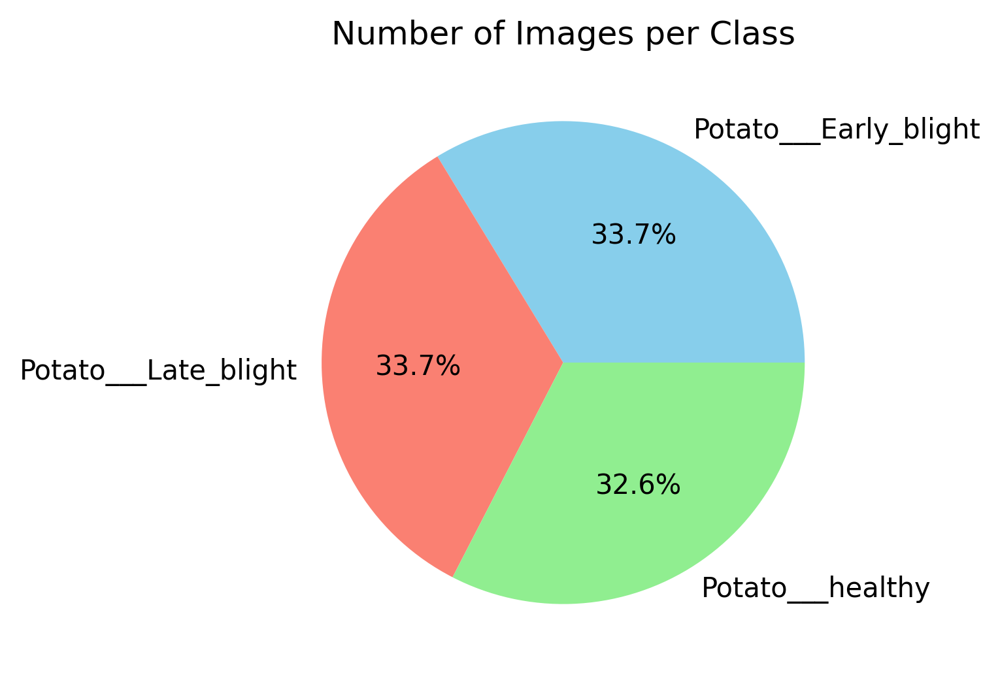

In [6]:
# Data from the previous step
classes = list(image_counts.keys())
counts = list(image_counts.values())

# Create the pie chart
plt.figure(figsize=(4, 4),dpi=300)
plt.pie(counts, labels=classes, autopct='%1.1f%%', colors=['skyblue', 'salmon','lightgreen' ])
plt.title('Number of Images per Class')
plt.show()

**Insight:**

1. **'Potato___Early_blight'**: This class includes 1000 images of potato leaves affected by early blight, a common fungal disease that causes dark, concentric spots on the leaves.

2. **'Potato___Late_blight'**: This class contains 1000 images of potato leaves with late blight, a more aggressive fungal disease known for causing large, dark, and rapidly spreading lesions.

3. **'Potato___healthy'**: This class consists of 966 images of healthy potato leaves with no visible signs of disease.

In [7]:
# total number of batches in the dataset.
len(dataset)

93

### Step 2: Visualization of Dataset

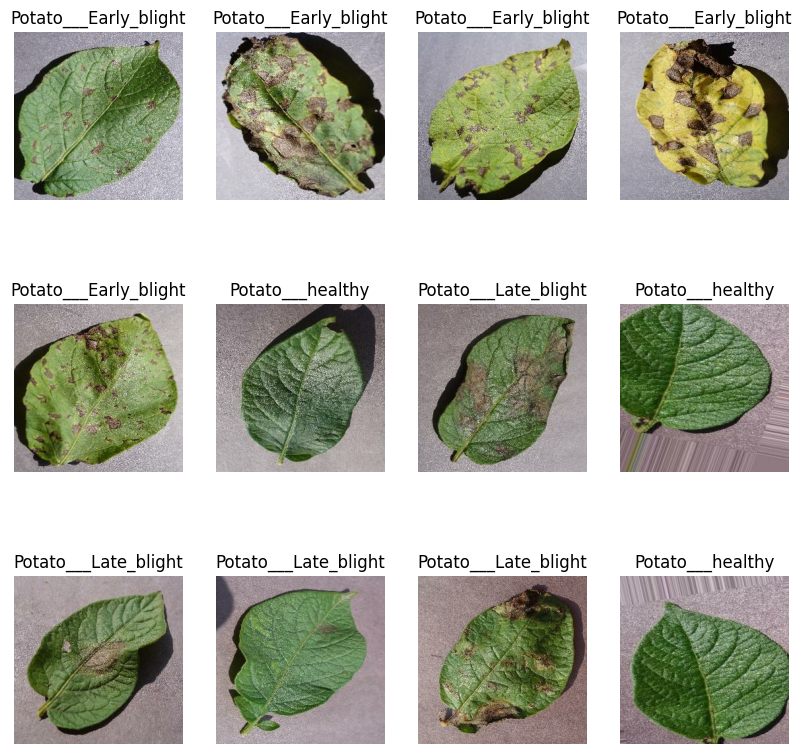

In [8]:
# Create a figure to display a grid of images from the dataset.
plt.figure(figsize=(10,10))
for image_batch, label_batch in dataset.take(1):
    for i in range (12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title (class_names[label_batch[i]])
        plt.axis('off')

**Explanation:**
* This code visualizes a sample of 12 images from the dataset, along with their corresponding class labels.

* The images are arranged in a 3x4 grid, and each image is labeled with its class name (e.g., "Potato___Early_blight", "Potato___Late_blight", or "Potato___healthy").
 
* This visualization helps in understanding what the data looks like, verifying that the images are correctly labeled, and ensuring that the data preparation steps (like resizing) have been applied correctly.

### Step 3: Splitting Data

In [9]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

**Explanation:**

- **Purpose**: This function partitions a TensorFlow dataset into training, validation, and test sets according to specified proportions.
- **Parameters**:
  - `ds`: The original dataset to be split.
  - `train_split`, `val_split`, `test_split`: Fractions for splitting the dataset into training, validation, and test sets, respectively. They must sum to 1.
  - `shuffle`: Whether to shuffle the dataset before splitting.
  - `shuffle_size`: Size of the shuffle buffer if shuffling is enabled.

- **Process**:
  1. **Assertion**: Checks that the sum of the split proportions equals 1.
  2. **Shuffling**: Randomizes the order of the dataset if specified.
  3. **Partitioning**: Computes the size of each subset and splits the dataset accordingly.
  4. **Return**: Provides three datasets: one for training, one for validation, and one for testing.

In [10]:
# Split the dataset into training, validation, and test sets using the `get_dataset_partitions_tf` function.
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [11]:
len(train_ds)

74

In [12]:
len(val_ds)

9

In [13]:
len(test_ds)

10

In [14]:
# Optimize the datasets for better performance during training and evaluation.
train_ds= train_ds.cache().shuffle(1000).prefetch(buffer_size= tf.data.AUTOTUNE)
val_ds= val_ds.cache().shuffle(1000).prefetch(buffer_size= tf.data.AUTOTUNE)
test_ds= test_ds.cache().shuffle(1000).prefetch(buffer_size= tf.data.AUTOTUNE)

**Explanation:**
1. `cache()`: Stores the dataset in memory after the first epoch to speed up subsequent epochs.
2. `shuffle(1000)`: Randomizes the order of data with a buffer size of 1000 to improve model training.
3. `prefetch(buffer_size=tf.data.AUTOTUNE)`: Enables prefetching of data to overlap the data loading with model training, improving efficiency.

### Step 4: Data Preprocessing

In [15]:
# Pre-processing pipeline to prepare images for model training.
resize_and_rescale= tf.keras.Sequential ([
    layers.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.Rescaling(1.0/255)
])

**Explanation:**

1. `layers.Resizing(IMAGE_SIZE, IMAGE_SIZE)`: Resizes images to the specified dimensions (256 x 256).
2. `layers.Rescaling(1.0/255)`: Scales pixel values from the range [0, 255] to [0, 1] by dividing by 255.Normalizes the pixel values of the images. 

**Data Augmentation**
* It is applied to create new, varied versions of existing images by applying transformations like rotations and flips. This makes the model better at recognizing patterns and prevents overfitting.

In [16]:
data_augmentation= tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
])

### Step 5 : Training the Model

#### 1. Convolution Neural Network(CNN)

In [17]:
# Defining the model architecture for classifying potato leaf diseases.
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)  
n_classes = 3  

model_cnn = models.Sequential([
    layers.InputLayer(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
    # Apply pre-processing and data augmentation
    resize_and_rescale,
    data_augmentation,

    # Convolutional and pooling layers to extract features
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    # Flatten the 3D features into 1D for classification
    layers.Flatten(),
    
    # Fully connected layers for classification
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

**Explanation:**

1. **Pre-processing and Augmentation**:
   - **`resize_and_rescale`**: Makes all images the same size and scales their pixel values to a range from 0 to 1.
   - **`data_augmentation`**: Creates new versions of images with random changes like flips and rotations to make the model more adaptable.

2. **Convolutional Layers**:
   - Finds patterns in the images, like edges or textures. Each `Conv2D` layer uses filters to look for these patterns.
   - **Activation Function (`relu`)**: Adds non-linearities, helping the model learn complex patterns in the images.

3. **Pooling Layers**:
   - Shrinks the image size to reduce the amount of data, making the model faster and focusing on the most important features.

4. **Flatten Layer**:
   - Transforms the 2D image data into a 1D list so it can be processed by the next layers.

5. **Dense Layers**:
   - **Fully Connected Layers**: `Dense(64, activation='relu')` helps the model learn complex relationships in the data.
   - **Output Layer**: `Dense(n_classes, activation='softmax')` gives probabilities for each class (disease type), allowing the model to make predictions.

In [18]:
model_cnn.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

### Step 6: Model Compiling

In [19]:
model_cnn.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

**Explanation:**

1. **Optimizer**:
   - **`optimizer='adam'`**: Adam is a method for adjusting the model's weights during training. It helps the model learn from the data by making small changes to improve accuracy.

2. **Loss Function**:
   - **`loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)`**: This measures how well the model’s predictions match the actual labels. 
     - **`SparseCategoricalCrossentropy`** is used for multi-class classification tasks where each image belongs to one of several classes.
     - **`from_logits=False`** means that the model outputs probabilities (not raw scores) directly.

3. **Metrics**:
   - **`metrics=['accuracy']`**: This tracks how often the model's predictions match the true labels. Accuracy tells us the percentage of correct predictions out of all predictions made.

#### Early Stopping:
* Early stopping monitors a specific performance measure, like validation accuracy or loss, during training. When this measure stops improving for a certain number of consecutive training cycles (epochs), training is stopped early.

* It helps to avoid overfitting (when the model learns too much from the training data and performs poorly on new data), saves computational resources, and ensures the model generalizes better to unseen data.

In [20]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

In [21]:
history = model_cnn.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 54s 688ms/step - accuracy: 0.4760 - loss: 0.9700 - val_accuracy: 0.7639 - val_loss: 0.5147
Epoch 2/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 53s 722ms/step - accuracy: 0.8385 - loss: 0.3936 - val_accuracy: 0.8160 - val_loss: 0.4620
Epoch 3/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 54s 731ms/step - accuracy: 0.8695 - loss: 0.3381 - val_accuracy: 0.9201 - val_loss: 0.2015
Epoch 4/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 53s 715ms/step - accuracy: 0.9277 - loss: 0.2022 - val_accuracy: 0.9340 - val_loss: 0.1738
Epoch 5/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 42s 561ms/step - accuracy: 0.9386 - loss: 0.1526 - val_accuracy: 0.9097 - val_loss: 0.1957
Epoch 6/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 43s 574ms/step - accuracy: 0.9584 - loss: 0.1149 - val_accuracy: 0.9236 - val_loss: 0.1826
Epoch 7/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 51s 682ms/step - accuracy: 0.9558 - loss: 0.1064 - val_accuracy: 0.8993 - val_loss: 0.2323
Epoch 8/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 53s 715ms/step - accuracy: 0.9760 - loss: 0.0721 - val_accu

**Explanation:**

- **`train_ds`**: This is the dataset used to train the model. It contains the images and their labels.

- **`batch_size=BATCH_SIZE`**: This determines how many images are processed together in one go. In this case, the model processes 32 images at a time.

- **`validation_data=val_ds`**: This is a separate set of images used to check the model’s performance during training. It helps ensure the model is learning well and not just memorizing the training data.

- **`verbose=1`**: This setting shows detailed information about the training process, including the progress of each epoch.

- **`epochs=20`**: This specifies how many times the model will go through the entire training dataset. In this case, the model will train for 20 complete passes through the data.

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

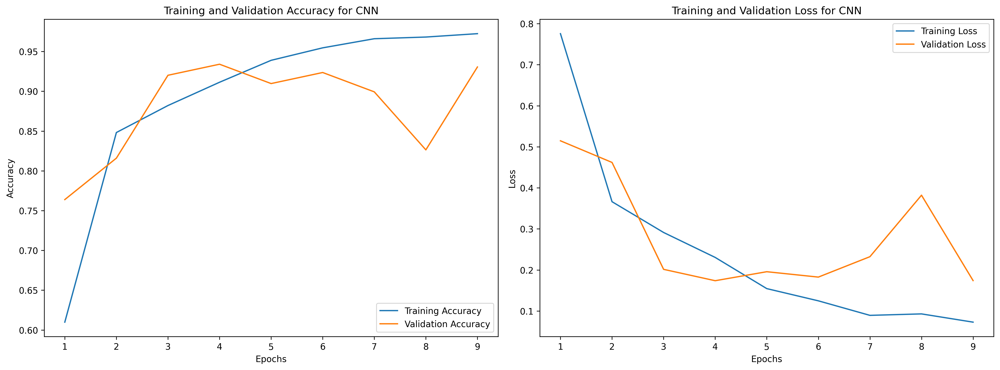

In [23]:
epochs_range = range(1, len(acc) + 1)

# Plot accuracy
plt.figure(figsize=(16, 6),dpi=300)
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy for CNN')
plt.legend(loc='lower right')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss for CNN')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [24]:
# Evaluate on the training data
train_loss, train_accuracy = model_cnn.evaluate(train_ds, verbose=1)
print(f'Training accuracy: {train_accuracy:.4f}')
print(f'Training loss: {train_loss:.4f}')

# Evaluate on the test data
test_loss, test_accuracy = model_cnn.evaluate(test_ds, verbose=1)
print(f'Test accuracy: {test_accuracy:.4f}')
print(f'Test loss: {test_loss:.4f}')

74/74 ━━━━━━━━━━━━━━━━━━━━ 13s 182ms/step - accuracy: 0.9223 - loss: 0.1868
Training accuracy: 0.9364
Training loss: 0.1733
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - accuracy: 0.9588 - loss: 0.1317
Test accuracy: 0.9531
Test loss: 0.1487


**Insight:**

- **Performance**: The model achieves high accuracy and low loss on both training (93.64% accuracy, 0.1733 loss) and test sets (95.31% accuracy, 0.1487 loss), indicating strong classification performance.

- **Generalization**: The slight increase in accuracy from training to test data (93.64% to 95.31%) shows the model generalizes well to new data.

- **Overfitting**: The slightly lower test loss compared to training loss suggests minimal overfitting, indicating the model performs well and generalizes effectively.

### Step 7: Model Evaluation

In [25]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

In [26]:
# Get predictions
y_true = []
y_pred = []

for images, labels in test_ds:
    predictions = model_cnn(images, training=False)
    y_true.extend(labels.numpy())
    y_pred.extend(tf.argmax(predictions, axis=1).numpy())

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print("Classification Report:\n", report)

Classification Report:
                        precision    recall  f1-score   support

Potato___Early_blight       0.97      0.96      0.96        97
 Potato___Late_blight       0.93      0.95      0.94       117
     Potato___healthy       0.97      0.95      0.96       106

             accuracy                           0.95       320
            macro avg       0.95      0.95      0.95       320
         weighted avg       0.95      0.95      0.95       320



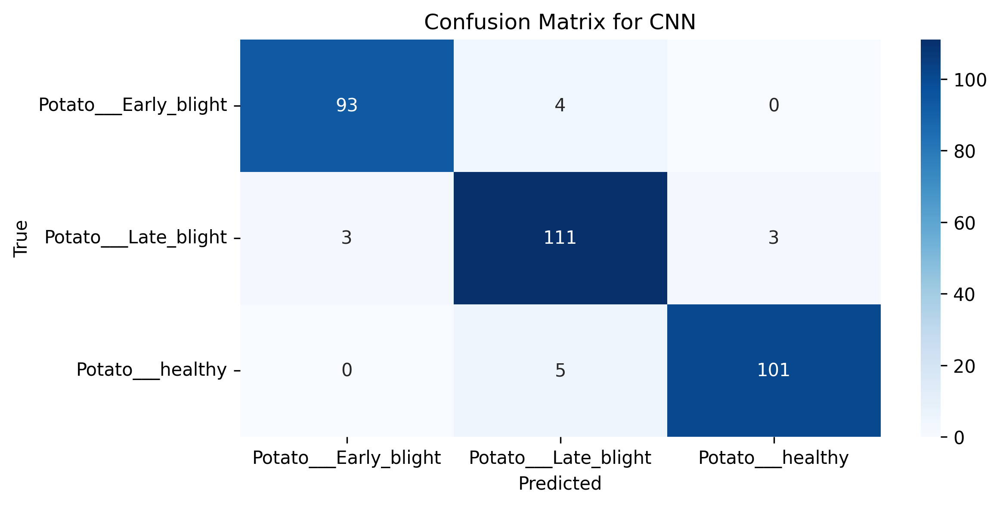

In [27]:
# Confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 4),dpi=300)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for CNN')
plt.show()

### Step 8: Prediction on Single Test Image

first image to predict
actual label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
predicted label: Potato___Early_blight


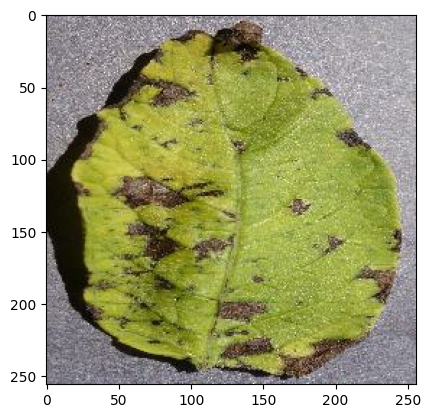

In [28]:
# Displays the first image from the test batch, show its actual label, 
# and predict the label using the trained model

import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_cnn.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

**Explanation:**
- The code displays the first image from the test batch, shows its actual label, and then uses the trained model to predict the class of the image.

- It prints out the predicted label based on the model’s output, allowing you to compare it with the actual label and assess the model’s prediction accuracy visually.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


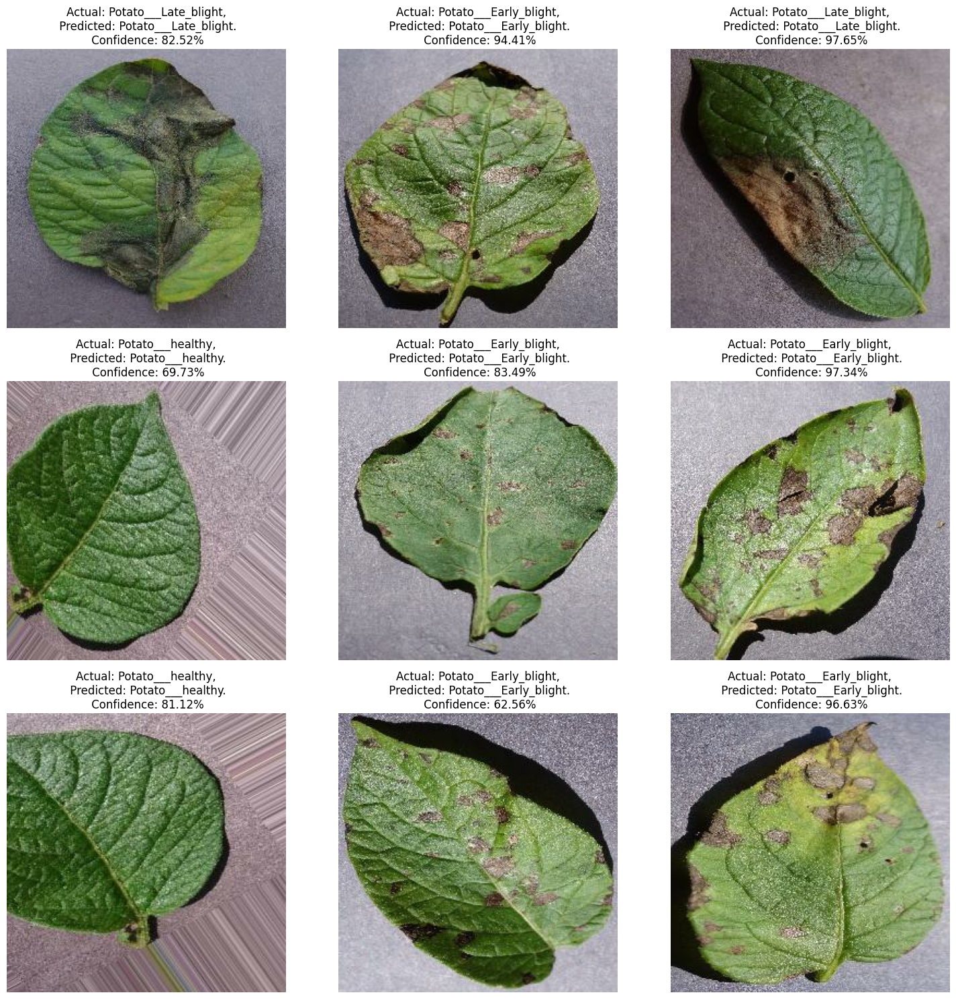

In [29]:
def predict(model_cnn, image):
    img_array = tf.keras.preprocessing.image.img_to_array(image)
    img_array = tf.expand_dims(img_array, 0)
    
    predictions = model_cnn.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    
    return predicted_class, confidence

# Visualization
for images, labels in test_ds.take(1):
    plt.figure(figsize=(15, 15))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)

        # Convert TensorFlow tensor to NumPy array before using plt.imshow
        image_np = images[i].numpy()
        plt.imshow(image_np.astype("uint8"))

        # Use the updated predict function with model_cnn
        predicted_class, confidence = predict(model_cnn, image_np)
        actual_class = class_names[labels[i].numpy()]  # Convert label tensor to numpy

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [30]:
model_cnn.save('CNN_model.keras')

### **Transfer Learning:**

Transfer learning involves taking a pre-trained model (a model trained on a large dataset) and adapting it to a new, but related task. This is especially useful when you have limited data for the new task.

#### 1. VGGNet (Visual Geometry Group Network.)
- VGG models, like VGG16 and VGG19, are deep convolutional neural networks known for their simplicity and use of small (3x3) convolutional filters.

- We can use a VGG model pre-trained on a large dataset like ImageNet and fine-tune it for a different classification task. This involves replacing and training the top (fully connected) layers while keeping the pre-trained convolutional layers unchanged.

In [31]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout

In [32]:
#Modelling
n_classes = 3

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(n_classes, activation='softmax')(x)

model_vgg = Model(inputs=base_model.input, outputs=predictions)
# Freeze the convolutional base
for layer in base_model.layers:
    layer.trainable = False

**Explanation:**

1. **VGG16 Base Model**:
   - **Pre-trained on ImageNet**: Utilizes weights trained on a large dataset to leverage learned features.
   - **Without Top Layers**: Excludes the original fully connected layers, allowing you to add your own.

2. **Custom Layers**:
   - **Flatten**: Converts 2D features to a 1D vector.
   - **Dense (512 units)**: Adds a fully connected layer with 512 neurons.
   - **Dropout (0.5)**: Reduces overfitting by randomly dropping 50% of neurons during training.
   - **Dense (n_classes)**: Final classification layer with softmax activation for multi-class output.

3. **Model Definition**:
   - **Combine Layers**: Creates a new model combining VGG16 features with custom classification layers.

4. **Freeze Base Layers**:
   - **Prevent Updates**: Keeps the pre-trained VGG16 convolutional layers unchanged during training, focusing on training only the newly added layers.

In [33]:
model_vgg.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │    16,777,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,493,955 (120.14 MB)

 Trainable params: 16,779,267 (64.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

##### Compiling the VGG Model
We use `adam` Optimizer, `SparseCategoricalCrossentropy` for losses, `accuracy` as a metric

In [34]:
model_vgg.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [35]:
history = model_vgg.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs = 50,
    callbacks=[early_stopping]
)

Epoch 1/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 656s 9s/step - accuracy: 0.7966 - loss: 21.9929 - val_accuracy: 0.9653 - val_loss: 0.5158
Epoch 2/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 378s 5s/step - accuracy: 0.9667 - loss: 0.8093 - val_accuracy: 0.9931 - val_loss: 0.0486
Epoch 3/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 353s 5s/step - accuracy: 0.9856 - loss: 0.2182 - val_accuracy: 0.9861 - val_loss: 0.0826
Epoch 4/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 908s 12s/step - accuracy: 0.9870 - loss: 0.1197 - val_accuracy: 0.9896 - val_loss: 0.0516
Epoch 5/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 1096s 15s/step - accuracy: 0.9912 - loss: 0.0577 - val_accuracy: 0.9931 - val_loss: 0.0341
Epoch 6/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 386s 5s/step - accuracy: 0.9856 - loss: 0.0974 - val_accuracy: 0.9931 - val_loss: 0.0263
Epoch 7/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 436s 6s/step - accuracy: 0.9839 - loss: 0.1698 - val_accuracy: 0.9931 - val_loss: 0.0099


In [36]:
acc1 = history.history['accuracy']
val_acc1 = history.history['val_accuracy']

loss1 = history.history['loss']
val_loss1 = history.history['val_loss']

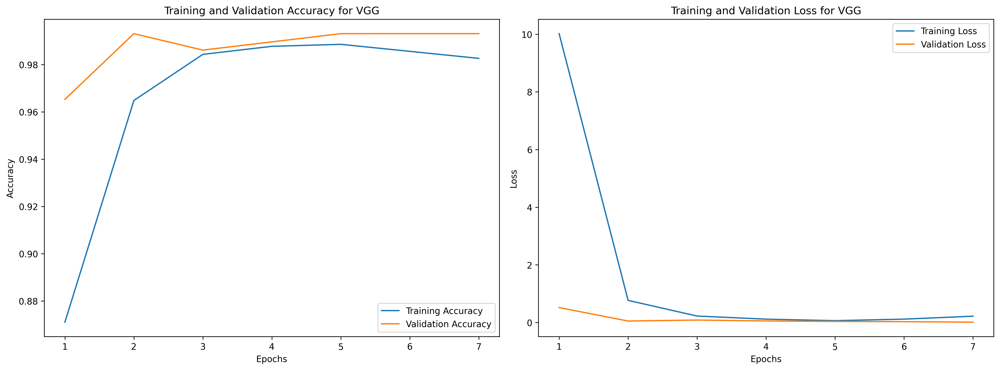

In [37]:
epochs_range = range(1, len(acc1) + 1)

# Plot accuracy
plt.figure(figsize=(16, 6),dpi=300)
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc1, label='Training Accuracy')
plt.plot(epochs_range, val_acc1, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy for VGG')
plt.legend(loc='lower right')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss1, label='Training Loss')
plt.plot(epochs_range, val_loss1, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss for VGG')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [38]:
# Evaluate on the training data
train_loss, train_accuracy = model_vgg.evaluate(train_ds, verbose=1)
print(f'Training accuracy: {train_accuracy:.4f}')
print(f'Training loss: {train_loss:.4f}')

# Evaluate on the test data
test_loss, test_accuracy = model_vgg.evaluate(test_ds, verbose=1)
print(f'Test accuracy: {test_accuracy:.4f}')
print(f'Test loss: {test_loss:.4f}')

74/74 ━━━━━━━━━━━━━━━━━━━━ 388s 5s/step - accuracy: 0.9951 - loss: 0.0429
Training accuracy: 0.9962
Training loss: 0.0329
10/10 ━━━━━━━━━━━━━━━━━━━━ 48s 5s/step - accuracy: 0.9952 - loss: 0.0146
Test accuracy: 0.9906
Test loss: 0.0606


**Insight:**

- **Performance**: The model shows excellent classification performance with very high accuracy on both training (99.62%, 0.0329 loss) and test sets (99.06%, 0.0606 loss).

- **Generalization**: The minimal drop in accuracy from training to test data (99.62% to 99.06%) indicates that the model generalizes well to new data.

- **Overfitting**: The increase in test loss compared to training loss suggests some overfitting, but the high test accuracy indicates that the model still performs very well on unseen data.

**Model Evaluation**

In [65]:
# Get predictions
y_true = []
y_pred = []

for images, labels in test_ds:
    predictions = model_vgg(images, training=False)
    y_true.extend(labels.numpy())
    y_pred.extend(tf.argmax(predictions, axis=1).numpy())

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print("Classification Report:\n", report)

Classification Report:
                        precision    recall  f1-score   support

Potato___Early_blight       1.00      1.00      1.00        97
 Potato___Late_blight       0.99      0.98      0.99       117
     Potato___healthy       0.98      0.99      0.99       106

             accuracy                           0.99       320
            macro avg       0.99      0.99      0.99       320
         weighted avg       0.99      0.99      0.99       320



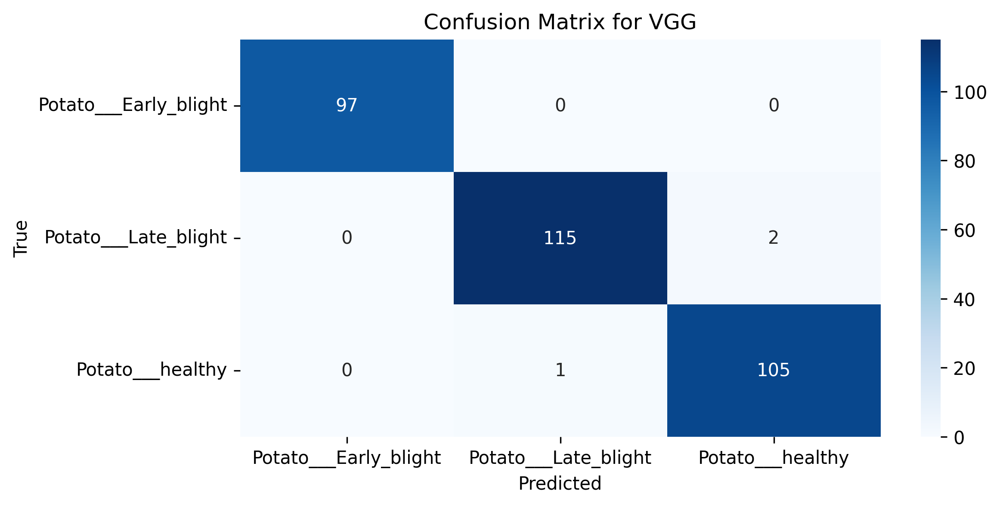

In [66]:
# Confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 4),dpi=300)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for VGG')
plt.show()

**Prediction on Test Data**

first image to predict
actual label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
predicted label: Potato___Early_blight


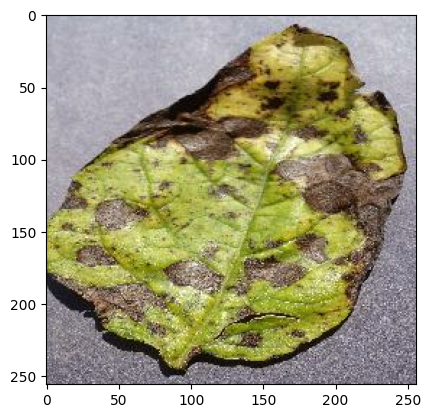

In [41]:
# Displays the first image from the test batch, show its actual label, 
# and predict the label using the trained model
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_vgg.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


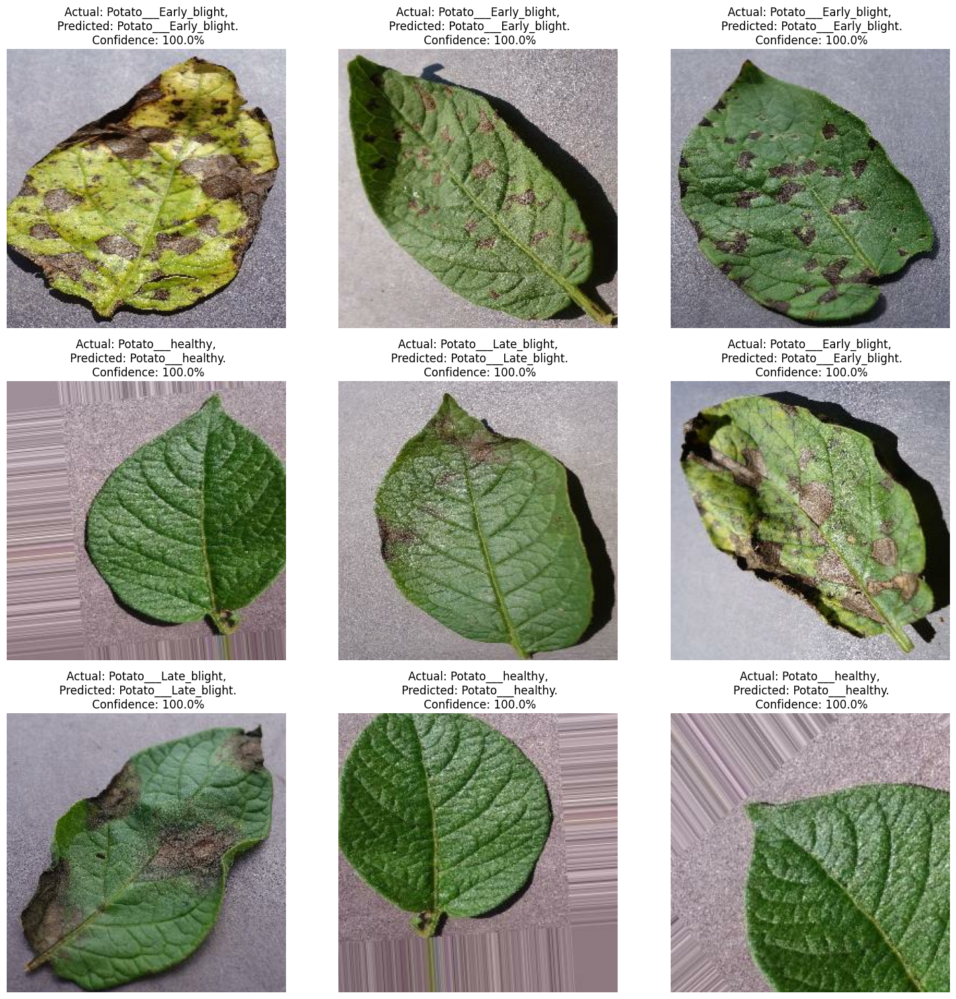

In [64]:
def predict(model_vgg, image):
    img_array = tf.keras.preprocessing.image.img_to_array(image)
    img_array = tf.expand_dims(img_array, 0)
    
    predictions = model_vgg.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    
    return predicted_class, confidence

# Visualization
for images, labels in test_ds.take(1):
    plt.figure(figsize=(15, 15))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)

        # Convert TensorFlow tensor to NumPy array before using plt.imshow
        image_np = images[i].numpy()
        plt.imshow(image_np.astype("uint8"))

        # Use the updated predict function with model_cnn
        predicted_class, confidence = predict(model_vgg, image_np)
        actual_class = class_names[labels[i].numpy()]  # Convert label tensor to numpy

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [43]:
model_vgg.save('VGG_model.keras')

#### 2. ResNet (Residual Network):

- ResNet models are known for their use of residual blocks, which help in training very deep networks by addressing the vanishing gradient problem. Common versions include ResNet18, ResNet34, ResNet50, etc.

- Similar to VGG, a ResNet model pre-trained on a large dataset can be adapted to new tasks. We can replace the final layers and train them while keeping the residual blocks frozen or fine-tuning them if needed.

In [44]:
from tensorflow.keras.applications import ResNet50

In [45]:
#Modelling
n_classes = 3

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(n_classes, activation='softmax')(x)

model_res = Model(inputs=base_model.input, outputs=predictions)
# Freeze the convolutional base
for layer in base_model.layers:
    layer.trainable = False

**Explanation:**

1. **ResNet50 Base Model**:
   - **Pre-trained on ImageNet**: Uses weights from a model trained on a large dataset to leverage learned features.
   - **Without Top Layers**: Excludes the original classification layers, allowing you to add your own.

2. **Custom Layers**:
   - **Flatten**: Converts the 2D output from ResNet50 to a 1D vector.
   - **Dense (512 units)**: Adds a fully connected layer with 512 neurons and ReLU activation to process the flattened features.
   - **Dropout (0.5)**: Applies dropout with a 50% rate to reduce overfitting.
   - **Dense (n_classes)**: Final classification layer with `n_classes` units for multi-class output, using softmax activation.

3. **Model Definition**:
   - **Combine Layers**: Combines the ResNet50 base with the custom classification layers to create a new model.

4. **Freeze Convolutional Base**:
   - **Prevent Updates**: Sets `trainable` to `False` for all layers in the ResNet50 base model, so only the custom layers will be trained, while the pre-trained convolutional base remains unchanged.

In [46]:
model_res.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 90,698,627 (345.99 MB)

 Trainable params: 67,110,915 (256.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

##### Compiling the ResNet Model
We use `adam` Optimizer, `SparseCategoricalCrossentropy` for losses, `accuracy` as a metric

In [47]:
model_res.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [48]:
history = model_res.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 161s 2s/step - accuracy: 0.7943 - loss: 15.1820 - val_accuracy: 0.9792 - val_loss: 0.5167
Epoch 2/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 162s 2s/step - accuracy: 0.9641 - loss: 1.4636 - val_accuracy: 0.9931 - val_loss: 0.2705
Epoch 3/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 166s 2s/step - accuracy: 0.9804 - loss: 0.5286 - val_accuracy: 0.9931 - val_loss: 0.1112
Epoch 4/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - accuracy: 0.9847 - loss: 0.2367 - val_accuracy: 0.9965 - val_loss: 0.0116
Epoch 5/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.9928 - loss: 0.1183 - val_accuracy: 1.0000 - val_loss: 8.8856e-04
Epoch 6/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - accuracy: 0.9912 - loss: 0.1529 - val_accuracy: 0.9965 - val_loss: 0.0426
Epoch 7/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 208s 3s/step - accuracy: 0.9939 - loss: 0.0873 - val_accuracy: 0.9931 - val_loss: 0.0968
Epoch 8/50
74/74 ━━━━━━━━━━━━━━━━━━━━ 180s 2s/step - accuracy: 0.9952 - loss: 0.0724 - val_accuracy: 0.996

In [49]:
acc2 = history.history['accuracy']
val_acc2 = history.history['val_accuracy']

loss2 = history.history['loss']
val_loss2 = history.history['val_loss']

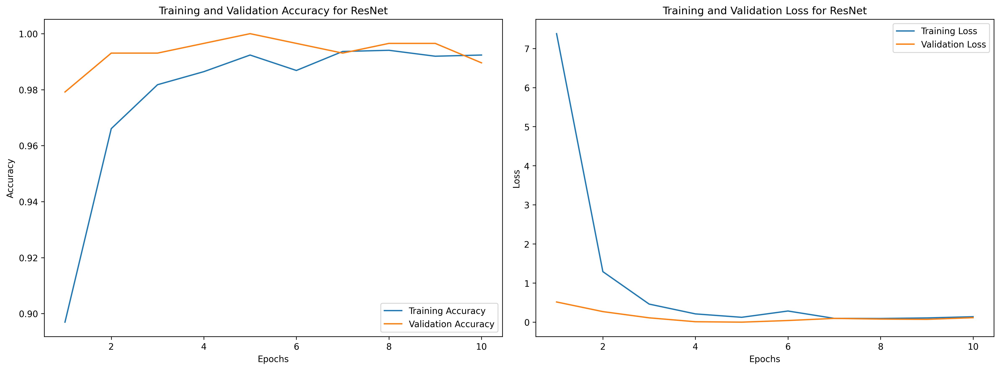

In [50]:
epochs_range = range(1, len(acc2) + 1)

# Plot accuracy
plt.figure(figsize=(16, 6),dpi=300)
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc2, label='Training Accuracy')
plt.plot(epochs_range, val_acc2, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy for ResNet')
plt.legend(loc='lower right')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss2, label='Training Loss')
plt.plot(epochs_range, val_loss2, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss for ResNet')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [51]:
# Evaluate on the training data
train_loss, train_accuracy = model_res.evaluate(train_ds, verbose=1)
print(f'Training accuracy: {train_accuracy:.4f}')
print(f'Training loss: {train_loss:.4f}')

# Evaluate on the test data
test_loss, test_accuracy = model_res.evaluate(test_ds, verbose=1)
print(f'Test accuracy: {test_accuracy:.4f}')
print(f'Test loss: {test_loss:.4f}')

74/74 ━━━━━━━━━━━━━━━━━━━━ 131s 2s/step - accuracy: 0.9990 - loss: 0.0101
Training accuracy: 0.9992
Training loss: 0.0066
10/10 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9902 - loss: 0.0653
Test accuracy: 0.9937
Test loss: 0.1500


**Insight:**

- **Performance**: The model achieves near-perfect accuracy on both the training (99.92% accuracy, 0.0066 loss) and test sets (99.37% accuracy, 0.1500 loss), demonstrating strong classification performance.

- **Generalization**: The high test accuracy of 99.37% suggests that the model generalizes well to new data. However, the higher test loss (0.1500) compared to the training loss (0.0066) indicates that while the model maintains accuracy, it does experience a larger error margin on the test set.

- **Overfitting**: The significant gap between the training and test loss, despite the high test accuracy, suggests potential overfitting. This implies that while the model performs exceptionally on the training data, its performance on unseen data is less consistent. Further evaluation on additional datasets or employing regularization techniques may help ensure better generalization and robustness.

**Model Evaluation**


In [52]:
# Get predictions
y_true = []
y_pred = []

for images, labels in test_ds:
    predictions = model_res(images, training=False)
    y_true.extend(labels.numpy())
    y_pred.extend(tf.argmax(predictions, axis=1).numpy())

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print("Classification Report:\n", report)

Classification Report:
                        precision    recall  f1-score   support

Potato___Early_blight       1.00      1.00      1.00        97
 Potato___Late_blight       0.99      0.99      0.99       117
     Potato___healthy       0.99      0.99      0.99       106

             accuracy                           0.99       320
            macro avg       0.99      0.99      0.99       320
         weighted avg       0.99      0.99      0.99       320



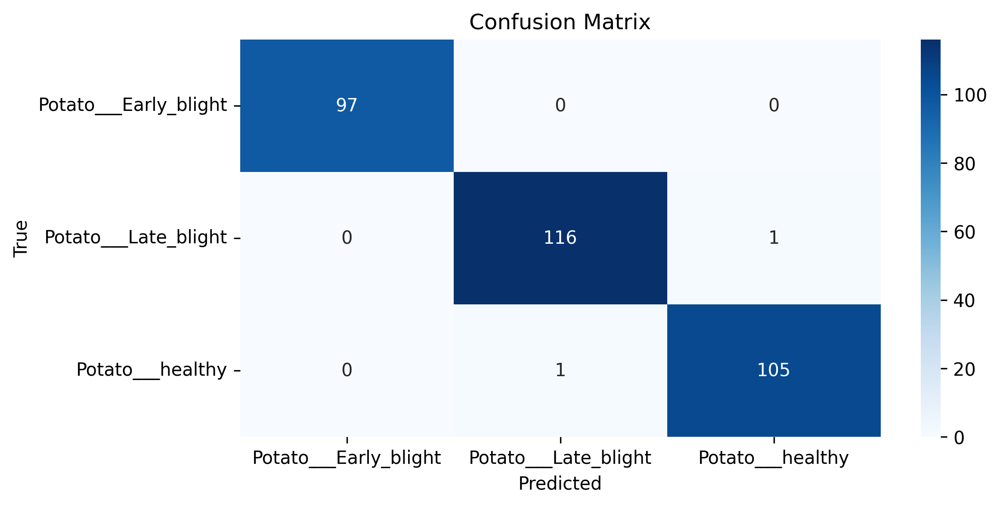

In [53]:
# Confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 4),dpi=300)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

**Prediction on Test Data**

first image to predict
actual label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
predicted label: Potato___Early_blight


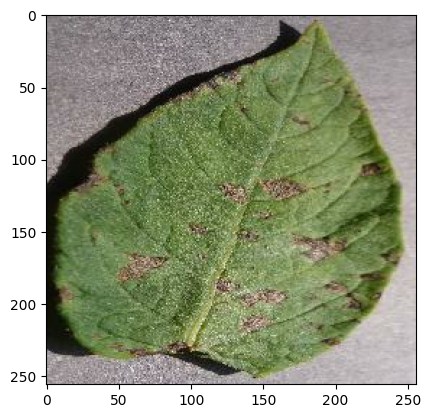

In [54]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_res.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


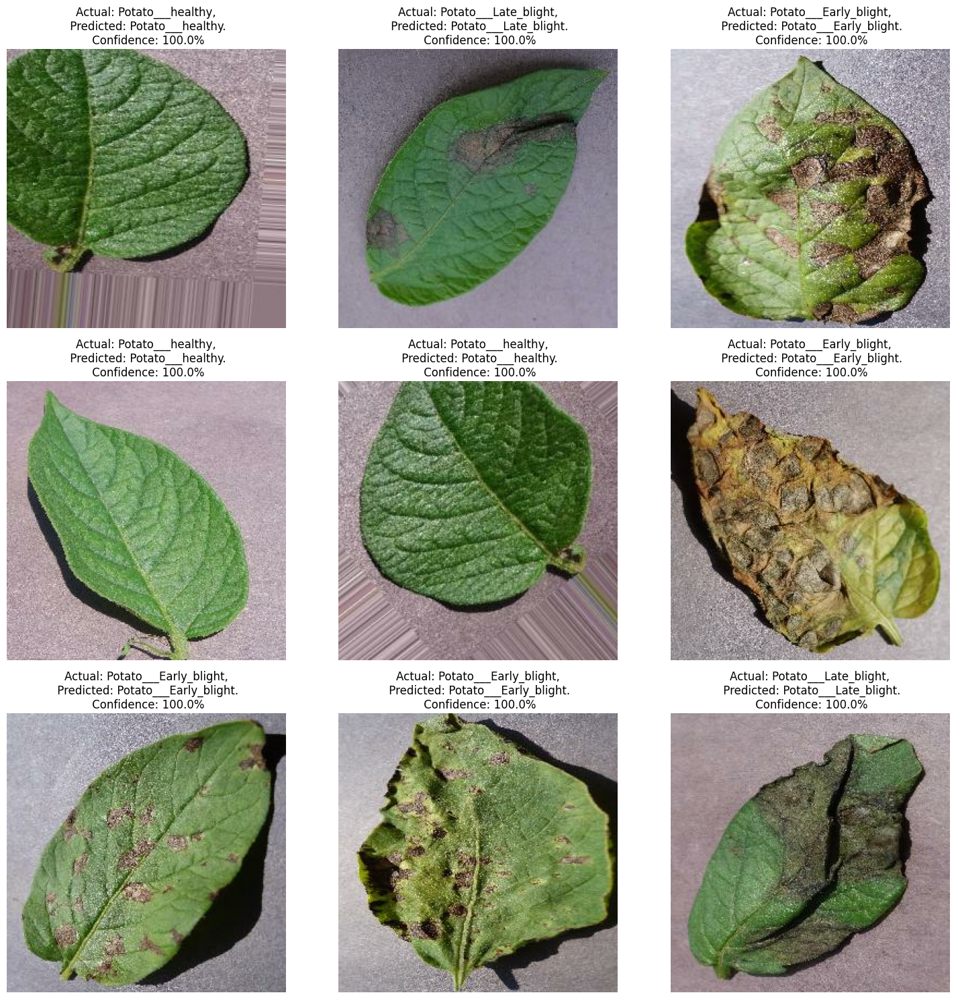

In [55]:
def predict(model_res, image):
    img_array = tf.keras.preprocessing.image.img_to_array(image)
    img_array = tf.expand_dims(img_array, 0)
    
    predictions = model_res.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    
    return predicted_class, confidence

# Visualization
for images, labels in test_ds.take(1):
    plt.figure(figsize=(15, 15))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)

        # Convert TensorFlow tensor to NumPy array before using plt.imshow
        image_np = images[i].numpy()
        plt.imshow(image_np.astype("uint8"))

        # Use the updated predict function with model_cnn
        predicted_class, confidence = predict(model_res, image_np)
        actual_class = class_names[labels[i].numpy()]  # Convert label tensor to numpy

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [56]:
model_res.save('ResNet_model.keras')

#### Visualization of Final Results

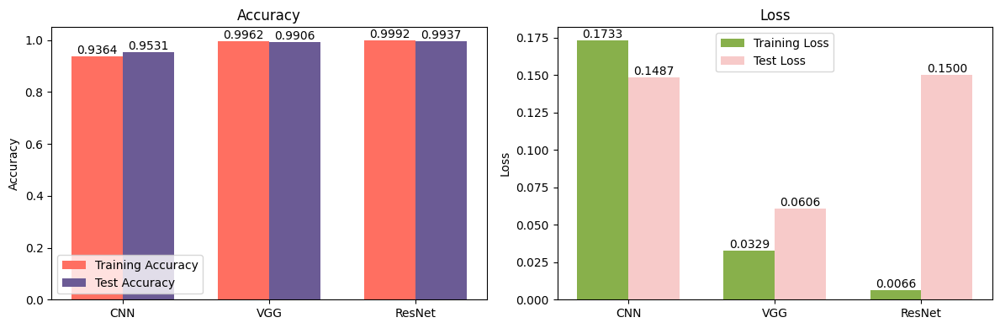

In [63]:
# Data
models = ['CNN', 'VGG', 'ResNet']
training_accuracy = [0.9364, 0.9962, 0.9992]
test_accuracy = [0.9531, 0.9906, 0.9937]

training_loss = [0.1733, 0.0329, 0.0066]
test_loss = [0.1487, 0.0606, 0.1500]

# Bar width
bar_width = 0.35
index = np.arange(len(models))

# Colors
color_training_accuracy = '#FF6F61'  # Coral
color_test_accuracy = '#6B5B95'  # Slate Blue
color_training_loss = '#88B04B'  # Olive Green
color_test_loss = '#F7CAC9'  # Peach

# Create subplots
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

# Plot Accuracy
bars_train_acc = ax[0].bar(index - bar_width/2, training_accuracy, bar_width, color=color_training_accuracy, label='Training Accuracy')
bars_test_acc = ax[0].bar(index + bar_width/2, test_accuracy, bar_width, color=color_test_accuracy, label='Test Accuracy')
ax[0].set_xticks(index)
ax[0].set_xticklabels(models)
ax[0].set_title('Accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

# Display values on bars
for bars in [bars_train_acc, bars_test_acc]:
    for bar in bars:
        height = bar.get_height()
        ax[0].text(bar.get_x() + bar.get_width() / 2, height, f'{height:.4f}', ha='center', va='bottom')

# Plot Loss
bars_train_loss = ax[1].bar(index - bar_width/2, training_loss, bar_width, color=color_training_loss, label='Training Loss')
bars_test_loss = ax[1].bar(index + bar_width/2, test_loss, bar_width, color=color_test_loss, label='Test Loss')
ax[1].set_xticks(index)
ax[1].set_xticklabels(models)
ax[1].set_title('Loss')
ax[1].set_ylabel('Loss')
ax[1].legend()

# Display values on bars
for bars in [bars_train_loss, bars_test_loss]:
    for bar in bars:
        height = bar.get_height()
        ax[1].text(bar.get_x() + bar.get_width() / 2, height, f'{height:.4f}', ha='center', va='bottom')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()


### Final Insights:
- **Performance Comparison**: All three models show high performance, with VGG and ResNet having slightly higher accuracies than the CNN. However, ResNet shows signs of overfitting based on the loss difference, despite high accuracy, indicating it may not generalize as well as the other models in real-world applications or on unseen data.

- **Generalization**: The VGG model appears to balance training and test performance the best, with minimal overfitting. The CNN also performs well but has slightly lower overall accuracy.

- **Recommendation**: Depending on the application's tolerance for overfitting and the importance of accuracy versus loss, VGG might be the optimal choice for balanced performance. However, if the test environment is similar to the training data, ResNet could be chosen for its higher accuracy, but with caution regarding its higher test loss.

### Best Model is VGG with Test Accuracy of  99.06 %.